`kernel width` and `weight`, `distance`

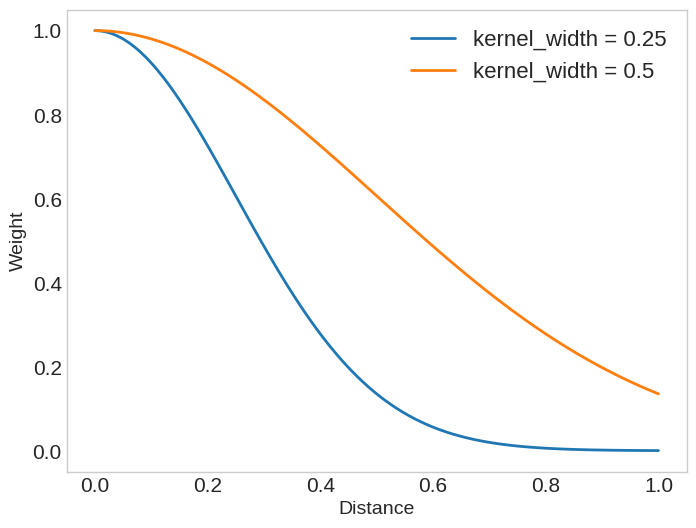

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

d = np.linspace(0, 1, 100)

# Gaussian kernel function
def gaussian_kernel(d, sigma):
    return np.exp(- (d ** 2) / (2 * sigma ** 2))

# Kernel widths and weights
sigma_1 = 0.25
sigma_2 = 0.5
w1 = gaussian_kernel(d, sigma_1)
w2 = gaussian_kernel(d, sigma_2)

fig = plt.figure(figsize=(8, 6))
plt.plot(d, w1, label='kernel_width = 0.25', linewidth=2)
plt.plot(d, w2, label='kernel_width = 0.5', linewidth=2)
plt.xlabel('Distance', fontsize=14)
plt.ylabel('Weight', fontsize=14)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.grid(False)
plt.legend(fontsize=16)
plt.show()
fig.savefig('kernel_width.svg', format='svg', dpi=1200)

## Step by Step with LIME
### Import libraries

In [ ]:
import copy
import torch
import sklearn
import warnings
import itertools
import requests
import skimage.io
import numpy as np
import pandas as pd
import sklearn.metrics
import skimage.segmentation
import matplotlib.pyplot as plt
import torchvision.models as models
import torchvision.transforms as transforms

from PIL import Image
from io import BytesIO
from collections import namedtuple
from sklearn.linear_model import LinearRegression

# Suppress warnings
warnings.filterwarnings('ignore')

# Change plt to white background
plt.style.use('seaborn-v0_8-whitegrid')

### Load model

In [ ]:
# Check for GPU availability and set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Running on device: {device}")

# Initialize a pre-trained ResNet model (PyTorch equivalent of InceptionV3)
resnet_model = models.resnet50(pretrained=True).to(device)
resnet_model.eval()  # Set the model to evaluation mode

Running on device: cuda


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to ./model/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 118MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

### Download and preprocess image

In [ ]:
# Image transformation for ResNet
resnet_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
# Load and preprocess the image
def load_and_preprocess_image(image_path):
    """Loads and preprocesses an image for ResNet."""
    img = Image.open(image_path)
    img_tensor = resnet_transform(img).unsqueeze(0).to(device)
    return img_tensor, np.array(img)

def download_image(url, save_path='downloaded_image.jpg'):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    img.save(save_path)
    return save_path

# Download and save the ImageNet class labels
def download_and_save_labels(url, save_path):
    """Downloads and saves the ImageNet class labels."""
    response = requests.get(url)
    response.raise_for_status()  # Check if the request was successful
    with open(save_path, 'w') as f:
        f.write(response.text)
    return save_path

image_url = "https://github.com/EliSchwartz/imagenet-sample-images/blob/master/n01644900_tailed_frog.JPEG?raw=true"
image_path = download_image(image_url)
img_tensor, Xi = load_and_preprocess_image(image_path)

# URL to fetch the ImageNet class labels
label_url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
label_path = download_and_save_labels(label_url, 'imagenet_classes.txt')

with open(label_path) as f:
    labels = [line.strip() for line in f.readlines()]

### Use the model to predict the image

In [ ]:
# Predict class of input image
def predict_image(model, img_tensor):
    """Predicts the class of the input image."""
    with torch.no_grad():
        output = model(img_tensor)
    probabilities = torch.nn.functional.softmax(output[0], dim=0)
    top_prob, top_catid = torch.topk(probabilities, 5)
    return top_prob, top_catid

top_prob, top_catid = predict_image(resnet_model, img_tensor)

# Print top 5 predictions
for i in range(top_prob.size(0)):
    print(f"{top_prob[i].item():.3f} -> class index: {top_catid[i].item()} -> class: {labels[top_catid[i].item()]}")

print(f"The predicted class is: {labels[top_catid[0].item()]}")

0.995 -> class index: 32 -> class: tailed frog
0.002 -> class index: 26 -> class: common newt
0.001 -> class index: 30 -> class: bullfrog
0.001 -> class index: 31 -> class: tree frog
0.000 -> class index: 38 -> class: banded gecko
The predicted class is: tailed frog


### 1. Perturb the image

In [ ]:
# Generate superpixels using quickshift algorithm
def generate_superpixels(image):
    """Generates superpixels for the given image."""
    superpixels = skimage.segmentation.quickshift(image, kernel_size=21, max_dist=200, ratio=0.2)
    return superpixels

superpixels = generate_superpixels(Xi)
num_superpixels = np.unique(superpixels).shape[0]
print(f"Number of superpixels: {num_superpixels}")

Number of superpixels: 4


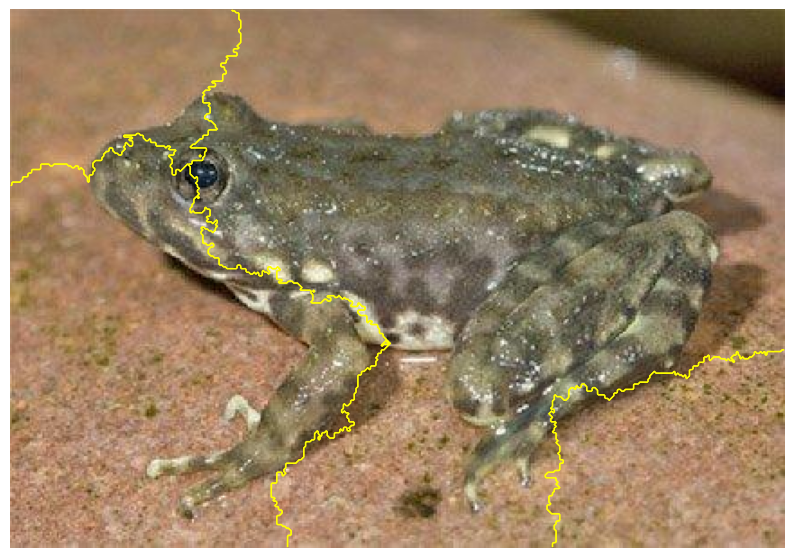

In [ ]:
# Visualize all superpixels with yellow border
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(Xi)
for superpixel in np.unique(superpixels):
    mask = superpixels == superpixel
    ax.contour(mask, colors='yellow', linewidths=1)
ax.axis('off')
plt.show()

In [ ]:
# Perturb the superpixels
def generate_binary_vectors(length):
    """Generates all possible binary vectors of a given length."""
    return np.array(list(itertools.product([0, 1], repeat=length)))

# len = 4 -> 2^4 = 16 binary vectors
perturbations = generate_binary_vectors(4)
print(perturbations)

[[0 0 0 0]
 [0 0 0 1]
 [0 0 1 0]
 [0 0 1 1]
 [0 1 0 0]
 [0 1 0 1]
 [0 1 1 0]
 [0 1 1 1]
 [1 0 0 0]
 [1 0 0 1]
 [1 0 1 0]
 [1 0 1 1]
 [1 1 0 0]
 [1 1 0 1]
 [1 1 1 0]
 [1 1 1 1]]


In [ ]:
# Function to perturb the image based on superpixels
def perturb_image(img, perturbation, segments):
    """Perturbs the image based on the given perturbation and superpixel segments."""
    active_pixels = np.where(perturbation == 1)[0]
    mask = np.zeros(segments.shape)
    for active in active_pixels:
        mask[segments == active] = 1
    # Expand the mask to 3 channels to keep the RGB color
    mask = np.repeat(mask[:, :, np.newaxis], 3, axis=2)
    perturbed_image = img * mask

    return perturbed_image.astype(np.uint8)

#### Visualize the perturbed images

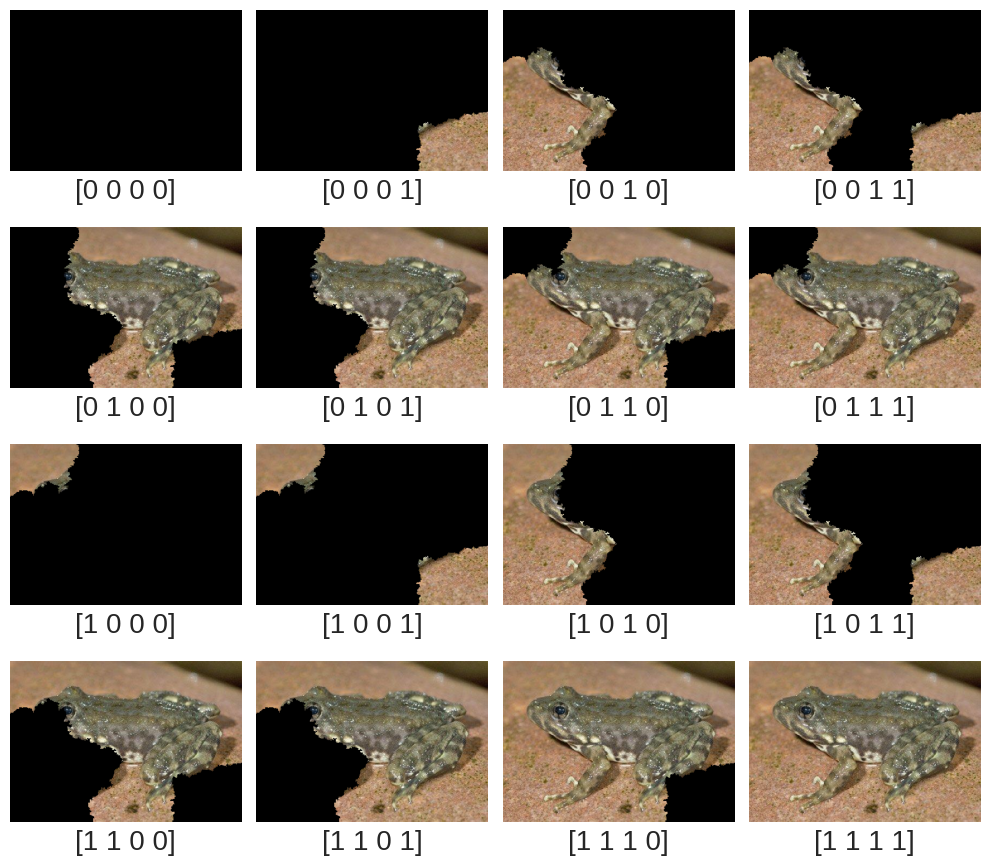

In [ ]:
fig, axes = plt.subplots(4, 4, figsize=(10, 9))
for i, ax in enumerate(axes.flat):
    perturbed_img = perturb_image(Xi, perturbations[i], superpixels)
    ax.imshow(perturbed_img)
    ax.axis('off')
    # Đặt tiêu đề dưới ảnh
    ax.text(0.5, -0.05, str(perturbations[i]), fontsize=20, ha='center', va='top', transform=ax.transAxes)

plt.tight_layout()
plt.show()

# Lưu ảnh định dạng SVG
fig.savefig('perturbations.svg', format='svg')

### 2. Use the model to predict the perturbed images

In [ ]:
# Predict classes for perturbed images
def predict_perturbed_images(perturbations, image, superpixels, model, transform):
    """Predicts the class probabilities for each perturbed image."""
    predictions = []
    for pert in perturbations:
        perturbed_img = perturb_image(image, pert, superpixels)
        perturbed_img_pil = Image.fromarray(perturbed_img.astype('uint8'))
        perturbed_img_tensor = transform(perturbed_img_pil).unsqueeze(0).to(device)
        with torch.no_grad():
            pred = model(perturbed_img_tensor)
        predictions.append(pred.cpu().numpy())
    return np.array(predictions)

predictions = predict_perturbed_images(perturbations, Xi, superpixels, resnet_model, resnet_transform)

#### Visualize the prediction results

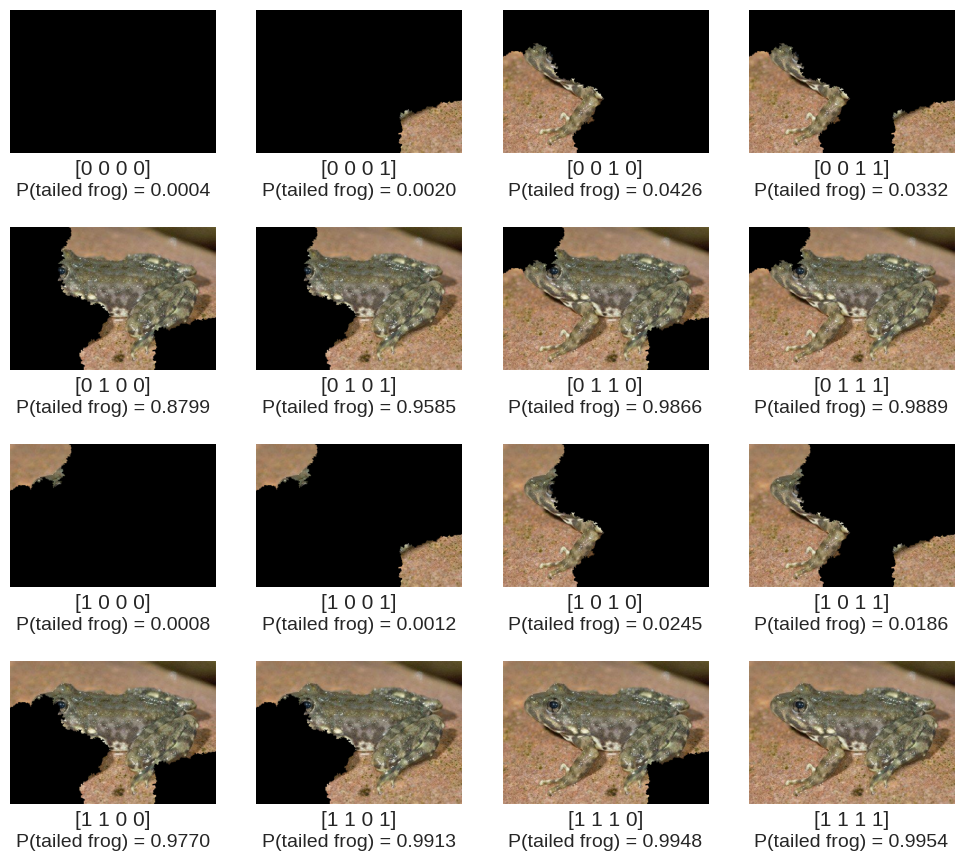

In [ ]:
probabilities = torch.nn.functional.softmax(torch.tensor(predictions), dim=2)
probabilities = probabilities.numpy()
probs = probabilities[:, 0, top_catid[0].item()]

fig, axes = plt.subplots(4, 4, figsize=(10, 9))
for i, ax in enumerate(axes.flat):
    perturbed_img = perturb_image(Xi, perturbations[i], superpixels)
    ax.imshow(perturbed_img)
    # Apply different fontsize to the perturbation
    ax.text(0.5, -0.05, f"{perturbations[i]}",
            ha='center', va='top', transform=ax.transAxes, fontsize=15)
    ax.text(0.5, -0.21, f"P(tailed frog) = {probs[i]:.4f}",
            ha='center', va='top', transform=ax.transAxes, fontsize=14)
    ax.axis('off')

plt.tight_layout()
plt.show()

# Save as SVG
fig.savefig('probs.svg', format='svg')

### 3. Calculate distances and weights

In [ ]:
# Compute distances and weights
def compute_distances_and_weights(perturbations, num_superpixels, kernel_width=0.25):
    """Computes distances between perturbations and the original image, and calculates weights."""
    original_image = np.ones(num_superpixels)[np.newaxis, :]
    distances = sklearn.metrics.pairwise_distances(perturbations, original_image, metric='cosine').ravel()
    weights = np.sqrt(np.exp(-(distances**2) / kernel_width**2))
    return distances, weights

distances, weights = compute_distances_and_weights(perturbations, num_superpixels)

df = pd.DataFrame(columns=['Superpixel 0', 'Superpixel 1', 'Superpixel 2', 'Superpixel 3', 'd', 'w', 'y'])

for i in range(len(perturbations)):
    df.loc[i] = [perturbations[i][0], perturbations[i][1], perturbations[i][2], perturbations[i][3], distances[i], weights[i], probs[i]]

df

,Superpixel 0,Superpixel 1,Superpixel 2,Superpixel 3,d,w,y
0,0.0,0.0,0.0,0.0,1.000000,0.000335,0.000444
1,0.0,0.0,0.0,1.0,0.500000,0.135335,0.001989
2,0.0,0.0,1.0,0.0,0.500000,0.135335,0.042633
3,0.0,0.0,1.0,1.0,0.292893,0.503440,0.033225
4,0.0,1.0,0.0,0.0,0.500000,0.135335,0.879854
5,0.0,1.0,0.0,1.0,0.292893,0.503440,0.958524
6,0.0,1.0,1.0,0.0,0.292893,0.503440,0.986611
7,0.0,1.0,1.0,1.0,0.133975,0.866240,0.988864
8,1.0,0.0,0.0,0.0,0.500000,0.135335,0.000794
9,1.0,0.0,0.0,1.0,0.292893,0.503440,0.001239


### 4. Select top features to explain the prediction

In [ ]:
def get_top_features(coeff, num_top_features=2):
    """Identifies the top features based on the linear model coefficients."""
    top_features = np.argsort(coeff)[-num_top_features:]
    return top_features

num_top_features = 1

### 5. Fit a linear model

In [ ]:
class_to_explain = top_catid[0].item()

simpler_model = LinearRegression()
simpler_model.fit(X=perturbations, y=probabilities[:, 0, class_to_explain], sample_weight=weights)

coeff = simpler_model.coef_

print("Linear model equation:")
print("y = ", end="")
for i in range(len(coeff)):
    print(f"{coeff[i]:.3f} * x{i} + ", end="")

print(str(simpler_model.intercept_.round(3)))

top_features = get_top_features(coeff, num_top_features)

Linear model equation:
y = 0.011 * x0 + 0.970 * x1 + 0.023 * x2 + 0.006 * x3 + -0.011


### 6. Explain the prediction

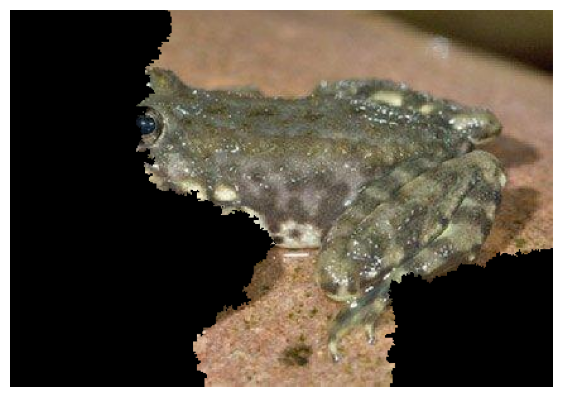

In [ ]:
# Generate and display the LIME explanation
def show_lime_explanation(image, top_features, superpixels, num_superpixels):
    """
    Generates and displays the LIME explanation image, overlaying the
    explanation on top of the original image.
    """
    fig, ax = plt.subplots(figsize=(7, 7))

    # Create a mask where 1 indicates pixels to highlight (top features)
    perturbation = np.zeros(num_superpixels)
    perturbation[top_features] = True

    active_pixels = np.where(perturbation == 1)[0]
    mask = np.zeros(superpixels.shape)
    for active in active_pixels:
        mask[superpixels == active] = 1
    perturbed_image = copy.deepcopy(image)
    perturbed_image = perturbed_image * mask[:, :, np.newaxis]

    # Display the image
    # plt.imshow(perturbed_image.astype(np.uint8))
    ax.imshow(perturbed_image.astype(np.uint8))
    ax.axis('off')

    plt.show()

show_lime_explanation(Xi, top_features, superpixels, num_superpixels)

## LIME with `lime` library

### Tabular data

In [ ]:
!pip install lime

from sklearn.datasets import load_iris
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from lime.lime_tabular import LimeTabularExplainer

In [ ]:
# -------------------------
# SECTION 1: Tabular Data
# -------------------------

# Load Iris dataset
iris = load_iris()
X = iris.data
y = iris.target

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train RandomForest model
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# LIME Tabular Explainer
explainer_tabular = LimeTabularExplainer(
    X_train,
    feature_names=iris.feature_names,
    class_names=iris.target_names,
    discretize_continuous=True,
    random_state=0
)

# Select a sample from the test set
sample_idx = 9
sample = X_test[sample_idx]

# Generate explanation
explanation = explainer_tabular.explain_instance(sample, clf.predict_proba, num_features=4)
explanation.show_in_notebook(show_table=True)

### Text data

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from lime.lime_text import LimeTextExplainer
import nltk
from sklearn.pipeline import make_pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

In [ ]:
# -------------------------
# SECTION 2: Text Data
# -------------------------

# Example text dataset
nltk.download('movie_reviews', download_dir='./nltk_data', quiet=True)
nltk.data.path.append('./nltk_data')
from nltk.corpus import movie_reviews

texts = [movie_reviews.raw(fileid) for fileid in movie_reviews.fileids()]
labels = [1 if fileid.split('/')[0] == 'pos' else 0 for fileid in movie_reviews.fileids()]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(texts, labels, test_size=0.2, random_state=42)

# Train text classifier
vectorizer = TfidfVectorizer(lowercase=True, stop_words='english', max_features=1000)
text_model = RandomForestClassifier(random_state=42)

pipeline = make_pipeline(vectorizer, text_model)
pipeline.fit(X_train, y_train)

# LIME Text Explainer
explainer_text = LimeTextExplainer(class_names=['Negative', 'Positive'], random_state=42)

# Select a sample from the test set
sample_idx = 10
sample_text = X_test[sample_idx]

# Generate explanation
explanation_text = explainer_text.explain_instance(sample_text, pipeline.predict_proba, num_features=10)
explanation_text.show_in_notebook(text=True)

### Image data

In [ ]:
import torch
import random
import numpy as np
from torchvision import models, transforms
from torchvision.models import Inception_V3_Weights
from PIL import Image
import requests
from io import BytesIO
from torch.nn import Softmax
from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt

# Set random seed for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

In [ ]:
# -------------------------
# SECTION 3: Image Data
# -------------------------

# Load pre-trained Inception v3 model
torch.hub.set_dir("./model")
model = models.inception_v3(weights=Inception_V3_Weights.DEFAULT, transform_input=False)
model.eval()

# Define image preprocessing pipeline
transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# URL to fetch the ImageNet class labels
label_url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"

# Download and save the ImageNet class labels
def download_and_save_labels(url, save_path):
    """Downloads and saves the ImageNet class labels."""
    response = requests.get(url)
    response.raise_for_status()  # Check if the request was successful
    with open(save_path, 'w') as f:
        f.write(response.text)
    return save_path

label_path = download_and_save_labels(label_url, 'imagenet_classes.txt')

with open(label_path) as f:
    labels = [line.strip() for line in f.readlines()]

# Load the image from URL
image_url = 'https://github.com/EliSchwartz/imagenet-sample-images/blob/master/n01644900_tailed_frog.JPEG?raw=true'
response = requests.get(image_url)
image = Image.open(BytesIO(response.content)).convert('RGB')
input_tensor = transform(image).unsqueeze(0)

# Predict the class probabilities
with torch.no_grad():
    output = model(input_tensor)
    probs = Softmax(dim=1)(output)

# Get the top predicted class
class_idx = torch.argmax(probs, 1).item()
class_label = labels[class_idx]

# Print the predicted class label
print(f"Predicted class index: {class_idx}")
print(f"Predicted class label: {class_label}")

Predicted class index: 32
Predicted class label: tailed frog


  0%|          | 0/100 [00:00<?, ?it/s]

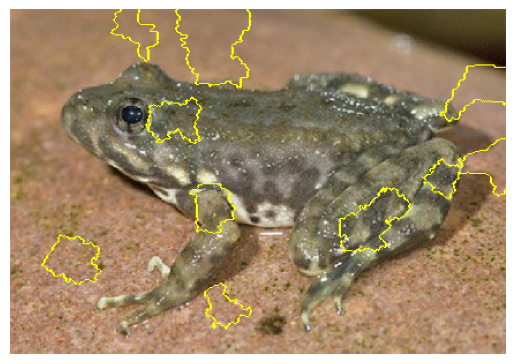

In [ ]:
# LIME Image Explainer
explainer_image = lime_image.LimeImageExplainer(random_state=seed)

# Define a prediction function for LIME
def predict_fn(images):
    model.eval()
    batch = torch.stack([transform(Image.fromarray(img)) for img in images], dim=0)
    with torch.no_grad():
        outputs = model(batch)
        probabilities = Softmax(dim=1)(outputs)
    return probabilities.numpy()

# Generate explanation
explanation_image = explainer_image.explain_instance(
    np.array(image),
    predict_fn,
    top_labels=5,
    hide_color=0,
    num_samples=100
)

# Display explanation for the top label
image, mask = explanation_image.get_image_and_mask(
    class_idx, positive_only=True, num_features=10, hide_rest=False
)

plt.imshow(mark_boundaries(image, mask))
plt.axis("off")
plt.show()

## Step by Step with ANCHOR

### Define the anchor data

In [ ]:
AnchorCandidate = namedtuple('AnchorCandidate', ['feature_mask', 'precision', 'coverage', 'num_samples'])

### Define function to get the prediction

In [ ]:
def get_model_prediction(model, image, transform, superpixels, feature_mask):
    """
    Gets the model prediction for a perturbed image based on the feature mask (anchor).
    """

    perturbed_image = copy.deepcopy(image)

    # Create a mask where 1 indicates pixels to keep, and 0 indicates pixels to replace with white
    mask = np.zeros(superpixels.shape)
    for feature in np.where(feature_mask == 1)[0]:
        mask[superpixels == feature] = 1

    # Replace the pixels outside the feature mask with white
    color = [255, 255, 255]
    perturbed_image[mask == 0] = color

    # Convert the perturbed image to a tensor
    perturbed_img_pil = Image.fromarray(perturbed_image.astype('uint8'))
    perturbed_img_tensor = transform(perturbed_img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(perturbed_img_tensor)
    probabilities = torch.nn.functional.softmax(output[0], dim=0).cpu().numpy()

    return probabilities

### Visualize the perturbed anchor

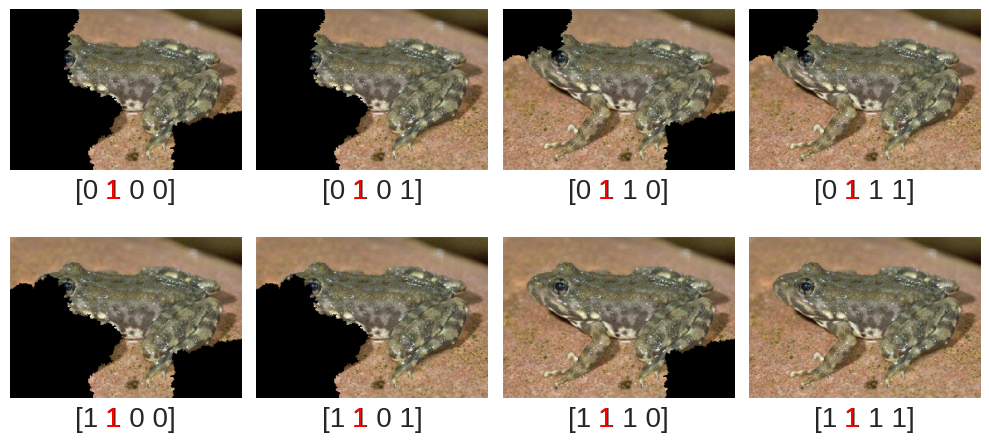

In [ ]:
import matplotlib.pyplot as plt

# Define the samples of candidate [0, 1, 0, 0]
perturbations = [
    [0, 1, 0, 0],
    [0, 1, 0, 1],
    [0, 1, 1, 0],
    [0, 1, 1, 1],
    [1, 1, 0, 0],
    [1, 1, 0, 1],
    [1, 1, 1, 0],
    [1, 1, 1, 1]
]
perturbations = np.array(perturbations)

fig, axes = plt.subplots(2, 4, figsize=(10, 5))
for i, ax in enumerate(axes.flat):
    perturbed_img = perturb_image(Xi, perturbations[i], superpixels)
    ax.imshow(perturbed_img)
    ax.axis('off')
    # Đặt tiêu đề dưới ảnh
    ax.text(0.5, -0.05, str(perturbations[i]), fontsize=20, ha='center', va='top', transform=ax.transAxes)
    ax.text(0.445, -0.05, "1", ha='center', va='top', color='red', fontsize=20, transform=ax.transAxes)

plt.tight_layout()
plt.show()

# Lưu ảnh định dạng SVG
fig.savefig('perturbations.svg', format='svg')

### Get the precision and coverage

In [ ]:
def calculate_precision_and_coverage(model, image, transform, superpixels, feature_mask, class_to_explain, num_samples):
    """Calculates precision and coverage of an anchor."""

    correct_predictions = 0

    # For this simple example, we won't sample num_samples perturbed images
    for _ in range(num_samples):
        prediction = get_model_prediction(model, image, transform, superpixels, feature_mask)
        if np.argmax(prediction) == class_to_explain:
            correct_predictions += 1

    precision = correct_predictions / num_samples

    # Placeholder for coverage - Inverted estimation: the more feature mask there are, the less coverage it is
    coverage = 1 - (np.sum(feature_mask) / len(feature_mask))

    return precision, coverage

### Generate the anchor

In [ ]:
def generate_candidates(previous_candidates, superpixels, num_features_to_add=1):
    """Generates new anchor candidates by extending the previous best candidates."""

    new_candidates = []

    for candidate in previous_candidates:
        current_features = np.where(candidate.feature_mask == 1)[0]

        for _ in range(num_features_to_add):
            available_features = np.setdiff1d(np.arange(num_superpixels), current_features)

            if available_features.size > 0:
                feature_to_add = np.random.choice(available_features)
                new_feature_mask = candidate.feature_mask.copy()
                new_feature_mask[feature_to_add] = 1
                new_candidates.append(AnchorCandidate(new_feature_mask, 0, 0, 0))
                current_features = np.append(current_features, feature_to_add)

    return new_candidates

### Get the explanation

In [ ]:
def select_best_candidates(candidates, num_to_select, model, image, transform, superpixels, class_to_explain, num_samples):
    """Selects the best candidates using a multi-armed bandit approach (simplified)."""

    for i, candidate in enumerate(candidates):
        precision, coverage = calculate_precision_and_coverage(model, image, transform, superpixels, candidate.feature_mask, class_to_explain, num_samples)
        candidates[i] = candidate._replace(precision=precision, coverage=coverage, num_samples=num_samples)

    # Sort by a combined score that considers both precision and coverage
    # Here, we use a simple weighted sum: 0.7 * precision + 0.3 * coverage
    candidates.sort(key=lambda x: (0.7 * x.precision + 0.3 * x.coverage), reverse=True)

    return candidates[:num_to_select]

### Visualize the explanation

In [ ]:
def explain_instance_with_anchors(model, image, transform, superpixels, class_to_explain, threshold=0.25, beam_width=4, num_samples_per_anchor=100):
    """Explains an instance using the Anchors algorithm."""

    initial_candidate = AnchorCandidate(np.zeros(num_superpixels), 0, 0, 0)
    best_candidates = [initial_candidate]
    best_anchor = initial_candidate

    while best_anchor.precision < threshold:
        new_candidates = generate_candidates(best_candidates, superpixels)
        if not new_candidates:
            break

        best_candidates = select_best_candidates(new_candidates, beam_width, model, image, transform, superpixels, class_to_explain, num_samples_per_anchor)

        if best_candidates:
            best_anchor = best_candidates[0]
            print(f"Current best anchor precision: {best_anchor.precision}, coverage: {best_anchor.coverage:.2f}")

    return best_anchor

class_to_explain = top_catid[0].item()
best_anchor = explain_instance_with_anchors(resnet_model, Xi, resnet_transform, superpixels, class_to_explain)

print(f"Final anchor precision: {best_anchor.precision}, coverage: {best_anchor.coverage:.2f}")

Current best anchor precision: 0.0, coverage: 0.75
Current best anchor precision: 0.0, coverage: 0.50
Current best anchor precision: 1.0, coverage: 0.25
Final anchor precision: 1.0, coverage: 0.25


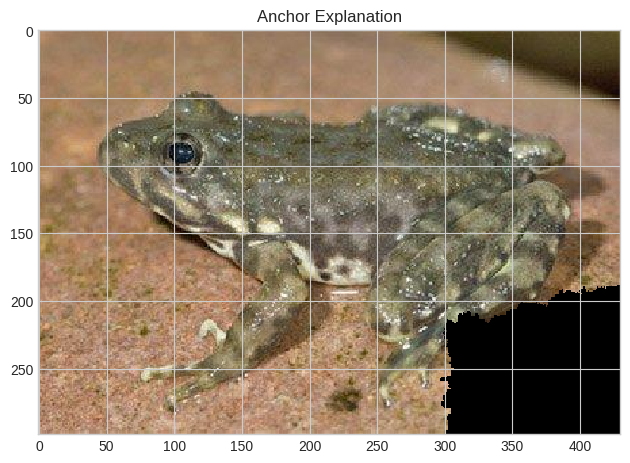

In [ ]:
# Visualization of the Anchor
def show_anchor_explanation(image, anchor, superpixels):
    """
    Generates and displays the Anchor explanation image.
    """

    # Create a mask where 1 indicates pixels to highlight (the anchor)
    mask = np.zeros(superpixels.shape)
    for feature in np.where(anchor.feature_mask == 1)[0]:
        mask[superpixels == feature] = 1

    # Create a copy of the original image to modify
    display_image = copy.deepcopy(image)

    # Apply the mask: Keep only the anchor pixels from the perturbed image
    display_image = display_image * mask[:, :, np.newaxis]

    # Display the image
    final_image = display_image

    # Display the image
    skimage.io.imshow(final_image.astype(np.uint8))
    plt.title("Anchor Explanation")
    plt.show()

show_anchor_explanation(Xi, best_anchor, superpixels)

## ANCHOR with `anchor` library

### Tabular data

In [ ]:
%pip install anchor-exp

In [ ]:
from __future__ import print_function
import numpy as np
import sys
import sklearn
import sklearn.ensemble
import sklearn.metrics

# Nếu đang chạy trong IPython/Jupyter, tải và kích hoạt autoreload
try:
    get_ipython().run_line_magic('load_ext', 'autoreload')
    get_ipython().run_line_magic('autoreload', '2')
except Exception:
    pass

from anchor import utils
from anchor import anchor_tabular

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
!wget https://archive.ics.uci.edu/static/public/2/adult.zip -P ./datasets/
!unzip ./datasets/adult.zip -d ./datasets/adult/

--2025-02-11 03:55:34--  https://archive.ics.uci.edu/static/public/2/adult.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified
Saving to: ‘./datasets/adult.zip.1’

adult.zip.1             [    <=>             ] 605.70K   678KB/s    in 0.9s    

2025-02-11 03:55:35 (678 KB/s) - ‘./datasets/adult.zip.1’ saved [620237]

Archive:  ./datasets/adult.zip
replace ./datasets/adult/Index? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ./datasets/adult/Index  
replace ./datasets/adult/adult.data? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ./datasets/adult/adult.data  
replace ./datasets/adult/adult.names? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ./datasets/adult/adult.names  
replace ./datasets/adult/adult.test? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ./datasets/adult/adult.test  

In [ ]:
# Đặt seed cho numpy để kết quả có thể tái lập
np.random.seed(1)

# Load dataset Adult với các tuỳ chọn: cân bằng, phân rã (discretize),...
dataset_folder = './datasets/'
dataset = utils.load_dataset(
    'adult',
    balance=True,
    dataset_folder=dataset_folder,
    discretize=True
)

# Huấn luyện mô hình RandomForestClassifier trên dữ liệu gốc
clf = sklearn.ensemble.RandomForestClassifier(n_estimators=50, n_jobs=5)
clf.fit(dataset.train, dataset.labels_train)

train_acc = sklearn.metrics.accuracy_score(dataset.labels_train, clf.predict(dataset.train))
test_acc = sklearn.metrics.accuracy_score(dataset.labels_test, clf.predict(dataset.test))
print('Train accuracy: {:.2f}'.format(train_acc))
print('Test accuracy: {:.2f}'.format(test_acc))

Train accuracy: 0.94
Test accuracy: 0.85


In [ ]:
# Tạo AnchorTabularExplainer cho dữ liệu
explainer = anchor_tabular.AnchorTabularExplainer(
    dataset.class_names,
    dataset.feature_names,
    dataset.train,
    dataset.categorical_names
)

# Giải thích dự đoán cho một instance cụ thể (idx = 0)
idx = 0
np.random.seed(1)  # Đặt lại seed nếu cần tái lập kết quả
prediction = clf.predict(dataset.test[idx].reshape(1, -1))[0]
print('Prediction: ', explainer.class_names[prediction])

explanation = explainer.explain_instance(dataset.test[idx], clf.predict, threshold=0.95, tau=0.15)

print('Anchor: %s' % (' AND '.join(explanation.names())))
print('Precision: {:.2f}'.format(explanation.precision()))
print('Coverage: {:.2f}'.format(explanation.coverage()))

Prediction:  b'>50K'
Anchor: Education = Bachelors AND Relationship = Husband AND Occupation = Sales
Precision: 0.97
Coverage: 0.02


In [ ]:
# Đánh giá độ chính xác (precision) và độ bao phủ (coverage) của anchor trên tập test
features_anchor = explanation.features()
fit_anchor = np.where(
    np.all(dataset.test[:, features_anchor] == dataset.test[idx][features_anchor], axis=1)
)[0]
anchor_test_precision = np.mean(clf.predict(dataset.test[fit_anchor]) == prediction)
anchor_test_coverage = fit_anchor.shape[0] / float(dataset.test.shape[0])
print('Anchor test precision: {:.2f}'.format(anchor_test_precision))
print('Anchor test coverage: {:.2f}'.format(anchor_test_coverage))

Anchor test precision: 0.97
Anchor test coverage: 0.02


In [ ]:
# Nếu đang chạy trong Notebook, hiển thị trực quan kết quả giải thích
try:
    explanation.show_in_notebook()
except Exception:
    print("Không thể hiển thị giải thích trong Notebook.")

### Text data

In [ ]:
import os
import numpy as np
import sklearn
import sklearn.model_selection
import sklearn.linear_model
import spacy
from sklearn.feature_extraction.text import CountVectorizer
from anchor import anchor_text
import time

In [ ]:
!wget http://www.cs.cornell.edu/people/pabo/movie-review-data/rt-polaritydata.tar.gz -P ./datasets/sentiment-sentences
!tar -xzf ./datasets/sentiment-sentences/rt-polaritydata.tar.gz -C ./datasets/sentiment-sentences
!pip install spacy && python -m spacy download en_core_web_sm

URL transformed to HTTPS due to an HSTS policy
--2025-02-11 04:19:43--  https://www.cs.cornell.edu/people/pabo/movie-review-data/rt-polaritydata.tar.gz
Resolving www.cs.cornell.edu (www.cs.cornell.edu)... 132.236.207.53
Connecting to www.cs.cornell.edu (www.cs.cornell.edu)|132.236.207.53|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 487770 (476K) [application/x-gzip]
Saving to: ‘./datasets/sentiment-sentences/rt-polaritydata.tar.gz.1’

rt-polaritydata.tar 100%[===================>] 476.34K  1.07MB/s    in 0.4s    

2025-02-11 04:19:45 (1.07 MB/s) - ‘./datasets/sentiment-sentences/rt-polaritydata.tar.gz.1’ saved [487770/487770]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 36.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies

In [ ]:
def load_polarity(path='./datasets/sentiment-sentences/rt-polaritydata'):
    data, labels = [], []
    files = ['rt-polarity.neg', 'rt-polarity.pos']
    for label, file_name in enumerate(files):
        file_path = os.path.join(path, file_name)
        with open(file_path, 'rb') as f:
            for line in f:
                try:
                    line_str = line.decode('utf8').strip()
                    if line_str:
                        data.append(line_str)
                        labels.append(label)
                except Exception:
                    continue
    return data, labels

In [ ]:
nlp = spacy.load('en_core_web_sm')

data, labels = load_polarity()
train, test, train_labels, test_labels = sklearn.model_selection.train_test_split(
    data, labels, test_size=0.2, random_state=42)
train, val, train_labels, val_labels = sklearn.model_selection.train_test_split(
    train, train_labels, test_size=0.1, random_state=42)
train_labels = np.array(train_labels)
val_labels = np.array(val_labels)

vectorizer = CountVectorizer(min_df=1)
vectorizer.fit(train)
train_vectors = vectorizer.transform(train)
val_vectors = vectorizer.transform(val)

clf = sklearn.linear_model.LogisticRegression()
clf.fit(train_vectors, train_labels)
preds = clf.predict(val_vectors)
print('Validation accuracy: {:.2f}'.format(
    sklearn.metrics.accuracy_score(val_labels, preds)))

Validation accuracy: 0.75


In [ ]:
def predict_lr(texts):
    return clf.predict(vectorizer.transform(texts))

explainer = anchor_text.AnchorText(nlp, ['negative', 'positive'], use_unk_distribution=True)

np.random.seed(1)
text = 'This is a good book.'
pred_class = predict_lr([text])[0]
pred = explainer.class_names[pred_class]
alternative = explainer.class_names[1 - pred_class]
print('Prediction:', pred)

Prediction: positive


In [ ]:
exp = explainer.explain_instance(text, predict_lr, threshold=0.95)
print('Anchor:', ' AND '.join(exp.names()))
print('Precision: {:.2f}'.format(exp.precision()))
print()
print('Examples where anchor applies and model predicts', pred + ':')
print('\n'.join([example[0] for example in exp.examples(only_same_prediction=True)]))
print()
print('Examples where anchor applies and model predicts', alternative + ':')
print('\n'.join([example[0] for example in exp.examples(partial_index=0, only_different_prediction=True)]))

Anchor: good
Precision: 1.00

Examples where anchor applies and model predicts positive:
This UNK UNK good UNK .
UNK is a good UNK .
This UNK UNK good book .
UNK UNK a good book .
UNK UNK UNK good book .
This is UNK good book .
UNK is UNK good book UNK
UNK is UNK good UNK UNK
UNK is a good book .
UNK UNK a good UNK UNK

Examples where anchor applies and model predicts negative:



In [ ]:
# Nếu đang chạy trong Notebook, hiển thị trực quan kết quả giải thích
try:
    exp.show_in_notebook()
except Exception:
    print("Không thể hiển thị giải thích trong Notebook.")

### Image data

In [ ]:
import os
import time
import numpy as np
import torch
import urllib.request
import matplotlib.pyplot as plt
import skimage.io
import skimage.transform
from skimage import color
import anchor.anchor_image

In [ ]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'inception_v3', pretrained=True)
model.eval()
if torch.cuda.is_available():
    model.to('cuda')

def transform_img_fast(path):
    img = skimage.io.imread(path)
    if len(img.shape) != 3:
        img = skimage.color.gray2rgb(img)
    if img.shape[2] == 4:
        img = color.rgba2rgb(img)
    short_edge = min(img.shape[:2])
    yy = (img.shape[0] - short_edge) // 2
    xx = (img.shape[1] - short_edge) // 2
    crop_img = img[yy:yy + short_edge, xx:xx + short_edge]
    return (skimage.transform.resize(crop_img, (299, 299)) - 0.5) * 2

img_filename = "dog.jpg"
if not os.path.exists(img_filename):
    urllib.request.urlretrieve(
        "https://github.com/pytorch/hub/raw/master/images/dog.jpg",
        img_filename
    )

images = transform_img_fast(img_filename)

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to ./model/v0.10.0.zip


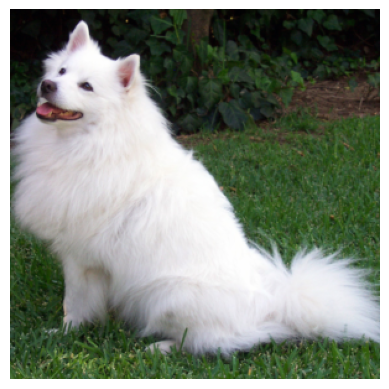

In [ ]:
def predict(images):
    images = images.transpose((0, 3, 1, 2))
    input_tensor = torch.FloatTensor(images)
    if torch.cuda.is_available():
        input_tensor = input_tensor.to('cuda')
    with torch.no_grad():
        output = model(input_tensor)
    probabilities = torch.nn.functional.softmax(output, dim=1)
    return probabilities.cpu().numpy()

def show_image(image, title=""):
    plt.figure()
    plt.imshow(image / 2 + 0.5)
    plt.axis("off")
    # plt.title(title)
    plt.show()

show_image(images, "Input Image")

In [ ]:
explainer = anchor.anchor_image.AnchorImage(
    # '/home/marcotcr/datasets/openimages/train/',
    dummys=torch.tensor(torch.ones(10, 3, 299, 299)),
    white=True,
    transform_img_fn=transform_img_fast,
    n=5000
)

segments, exp = explainer.explain_instance(
    images,
    predict,
    threshold=0.5,
    batch_size=50,
    tau=0.10,
    verbose=True,
    min_shared_samples=100,
    beam_size=2
)
print("Explanation:")
print(exp)

True pred 258
Best: 42 (mean:0.5000000000, n: 6, lb:0.0017) Worst: 9 (mean:0.3333, n: 6, ub:0.9910) B = 0.99
Best: 28 (mean:0.3333333333, n: 9, lb:0.0008) Worst: 45 (mean:0.0000, n: 4, ub:0.9810) B = 0.98
Best: 19 (mean:0.3000000000, n: 10, lb:0.0006) Worst: 36 (mean:0.1667, n: 6, ub:0.9777) B = 0.98
Best: 35 (mean:0.2857142857, n: 14, lb:0.0019) Worst: 56 (mean:0.1667, n: 6, ub:0.9791) B = 0.98
Best: 2 (mean:0.2727272727, n: 11, lb:0.0004) Worst: 47 (mean:0.2500, n: 8, ub:0.9716) B = 0.97
Best: 25 (mean:0.2500000000, n: 8, lb:0.0000) Worst: 41 (mean:0.2500, n: 8, ub:0.9726) B = 0.97
Best: 23 (mean:0.3636363636, n: 11, lb:0.0022) Worst: 37 (mean:0.1429, n: 7, ub:0.9652) B = 0.96
Best: 19 (mean:0.2333333333, n: 60, lb:0.0310) Worst: 64 (mean:0.1429, n: 7, ub:0.9662) B = 0.94
Best: 65 (mean:0.2307692308, n: 13, lb:0.0003) Worst: 8 (mean:0.1429, n: 7, ub:0.9669) B = 0.97
Best: 23 (mean:0.2295081967, n: 61, lb:0.0298) Worst: 17 (mean:0.2222, n: 9, ub:0.9594) B = 0.93
Best: 25 (mean:0.27586

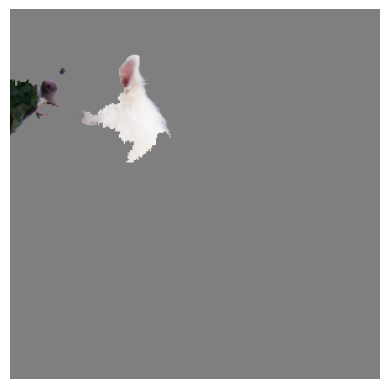

In [ ]:
def show_anchor(segments, exp, image):
    mask = np.zeros(segments.shape, dtype=bool)
    # Lấy các segment được chọn trong anchor
    for seg_idx, _, _, _, _ in exp:
        mask |= (segments == seg_idx)
    anchor_image = image.copy()
    anchor_image[~mask] = 0  # Ẩn những vùng không thuộc anchor
    show_image(anchor_image, "Anchor Explanation")

show_anchor(segments, exp, images)